### Assignment Research Methods in Data Science

In this task we are going to Predict the price of houses using Paris House Price dataset. It will help us to Learn Techniques of Machine Learning especially Regression

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from google.colab import output
output.enable_custom_widget_manager()

###Import Libraries

In [3]:
import pandas as pd     #Used for Reading CSV files and also for Data preprocessing
import seaborn as sns
import numpy as np      #
from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.gridspec as gridspec
from scipy import stats
from sklearn.ensemble import RandomForestRegressor # for building random forest model
from sklearn.ensemble import GradientBoostingRegressor # for building gradient boosting model
import xgboost as xgb # for building XGboosting model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler # for data preprocessing
import matplotlib.pyplot as plt # for data visualization
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn import ensemble


In [4]:
!pip install geemap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 58.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 77.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.5/130.5 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 94.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 71.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 103.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 85.1 MB/s eta 0:00:00
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-non

In [5]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 84.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 124.6 MB/s eta 0:00:00


In [6]:
import os
import geemap
import geopandas as gpd

###Importing Dataset

In [7]:
# Load the data
train_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Paris House Prediction/playground-series-s3e6/train.csv") # load training data
test_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Paris House Prediction/playground-series-s3e6/test.csv") # load test data

###Characterisitcs of Data

In [8]:
train_data.head()

,id,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price
0,0,34291,24,1,0,47,35693,2,1,2000,0,1,8,5196,369,0,3,3436795.2
1,1,95145,60,0,1,60,34773,1,4,2000,0,1,729,4496,277,0,6,9519958.0
2,2,92661,45,1,1,62,45457,4,8,2020,1,1,7473,8953,245,1,9,9276448.1
3,3,97184,99,0,0,59,15113,1,1,2000,0,1,6424,8522,256,1,9,9725732.2
4,4,61752,100,0,0,57,64245,8,4,2018,1,0,7151,2786,863,0,7,6181908.8


In [9]:
#Summary of data
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22730 entries, 0 to 22729
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 22730 non-null  int64  
 1   squareMeters       22730 non-null  int64  
 2   numberOfRooms      22730 non-null  int64  
 3   hasYard            22730 non-null  int64  
 4   hasPool            22730 non-null  int64  
 5   floors             22730 non-null  int64  
 6   cityCode           22730 non-null  int64  
 7   cityPartRange      22730 non-null  int64  
 8   numPrevOwners      22730 non-null  int64  
 9   made               22730 non-null  int64  
 10  isNewBuilt         22730 non-null  int64  
 11  hasStormProtector  22730 non-null  int64  
 12  basement           22730 non-null  int64  
 13  attic              22730 non-null  int64  
 14  garage             22730 non-null  int64  
 15  hasStorageRoom     22730 non-null  int64  
 16  hasGuestRoom       227

In [10]:
#Summary of data
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15154 entries, 0 to 15153
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   id                 15154 non-null  int64
 1   squareMeters       15154 non-null  int64
 2   numberOfRooms      15154 non-null  int64
 3   hasYard            15154 non-null  int64
 4   hasPool            15154 non-null  int64
 5   floors             15154 non-null  int64
 6   cityCode           15154 non-null  int64
 7   cityPartRange      15154 non-null  int64
 8   numPrevOwners      15154 non-null  int64
 9   made               15154 non-null  int64
 10  isNewBuilt         15154 non-null  int64
 11  hasStormProtector  15154 non-null  int64
 12  basement           15154 non-null  int64
 13  attic              15154 non-null  int64
 14  garage             15154 non-null  int64
 15  hasStorageRoom     15154 non-null  int64
 16  hasGuestRoom       15154 non-null  int64
dtypes: int64(17)

###Concatinating Training and Testing Data

In [11]:
df = pd.concat([test_data, train_data])
df

,id,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price
0,22730,47580,89,0,1,8,54830,5,3,1995,0,0,6885,8181,241,0,8,NaN
1,22731,62083,38,0,0,87,8576,10,3,1994,1,1,4601,9237,393,1,4,NaN
2,22732,90499,75,1,1,37,62454,9,6,1997,0,1,7454,2680,305,0,2,NaN
3,22733,16354,47,1,1,9,9262,6,5,2019,1,1,705,5097,122,1,5,NaN
4,22734,67510,8,0,0,55,24112,3,7,2014,1,1,3715,7979,401,1,9,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22725,22725,55825,84,1,0,70,12031,3,10,2000,0,0,4477,786,345,0,0,5594137.1
22726,22726,65870,88,1,0,49,23197,9,9,2015,0,1,4811,2454,755,0,7,6594705.0
22727,22727,93192,42,1,0,39,8539,10,5,2014,1,0,5595,4072,789,0,0,9321511.4
22728,22728,65797,86,1,0,89,23197,2,10,2000,1,0,5358,2513,411,0,0,6584708.2


In [12]:
df.shape

(37884, 18)

In [13]:
df.dtypes

id                     int64
squareMeters           int64
numberOfRooms          int64
hasYard                int64
hasPool                int64
floors                 int64
cityCode               int64
cityPartRange          int64
numPrevOwners          int64
made                   int64
isNewBuilt             int64
hasStormProtector      int64
basement               int64
attic                  int64
garage                 int64
hasStorageRoom         int64
hasGuestRoom           int64
price                float64
dtype: object

#Statistical Information of Data

In [14]:
df.describe()

,id,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price
count,37884.000000,3.788400e+04,37884.000000,37884.000000,37884.000000,37884.00000,37884.000000,37884.000000,37884.000000,37884.000000,37884.000000,37884.000000,37884.000000,37884.000000,37884.000000,37884.000000,37884.000000,2.273000e+04
mean,18941.500000,4.624349e+04,48.094631,0.478883,0.449794,46.94404,50082.512512,5.597799,5.613478,2007.293211,0.469671,0.461382,5289.954334,5063.791548,528.318155,0.462280,5.130081,4.634457e+06
std,10936.313136,4.257454e+04,28.201702,0.499560,0.497480,40.75970,30500.645192,2.734900,2.715122,92.189770,0.499086,0.498513,3020.460766,3030.709545,272.333070,0.498582,3.052908,2.925163e+06
min,0.000000,6.900000e+01,1.000000,0.000000,0.000000,1.00000,3.000000,1.000000,1.000000,1990.000000,0.000000,0.000000,4.000000,1.000000,4.000000,0.000000,0.000000,1.031350e+04
25%,9470.750000,1.981900e+04,25.000000,0.000000,0.000000,25.00000,23008.000000,3.000000,3.000000,2000.000000,0.000000,0.000000,3033.000000,2582.000000,297.000000,0.000000,3.000000,2.041739e+06
50%,18941.500000,4.423000e+04,47.000000,0.000000,0.000000,45.00000,50485.000000,6.000000,6.000000,2006.000000,0.000000,0.000000,5359.000000,4988.000000,512.000000,0.000000,5.000000,4.450823e+06
75%,28412.250000,7.135075e+04,75.000000,1.000000,1.000000,69.00000,76290.000000,8.000000,8.000000,2014.000000,1.000000,1.000000,7742.000000,7651.000000,760.000000,1.000000,8.000000,7.159920e+06
max,37883.000000,6.071330e+06,100.000000,1.000000,1.000000,6000.00000,977950.000000,10.000000,10.000000,10000.000000,1.000000,1.000000,91992.000000,96381.000000,9017.000000,1.000000,10.000000,1.000428e+07


In [15]:
df.drop_duplicates(inplace=True, ignore_index=True)

In [16]:
df.columns

Index(['id', 'squareMeters', 'numberOfRooms', 'hasYard', 'hasPool', 'floors',
       'cityCode', 'cityPartRange', 'numPrevOwners', 'made', 'isNewBuilt',
       'hasStormProtector', 'basement', 'attic', 'garage', 'hasStorageRoom',
       'hasGuestRoom', 'price'],
      dtype='object')

In [17]:
df.drop('id', axis = 1, inplace = True)


In [18]:
df1=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Paris House Prediction/playground-series-s3e6/test.csv")
USE_COLS = ['price','citycode']


### Visualization
We will start by creating a scatterplot matrix that will allow us to visualize the pair-wise relationships and correlations between the different features.

It is also quite useful to have a quick overview of how the data is distributed and wheter it cointains or not outliers.



<ipython-input-19-3f91744e7c46>:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.loc[:, feature], norm_hist = True, ax = ax1)


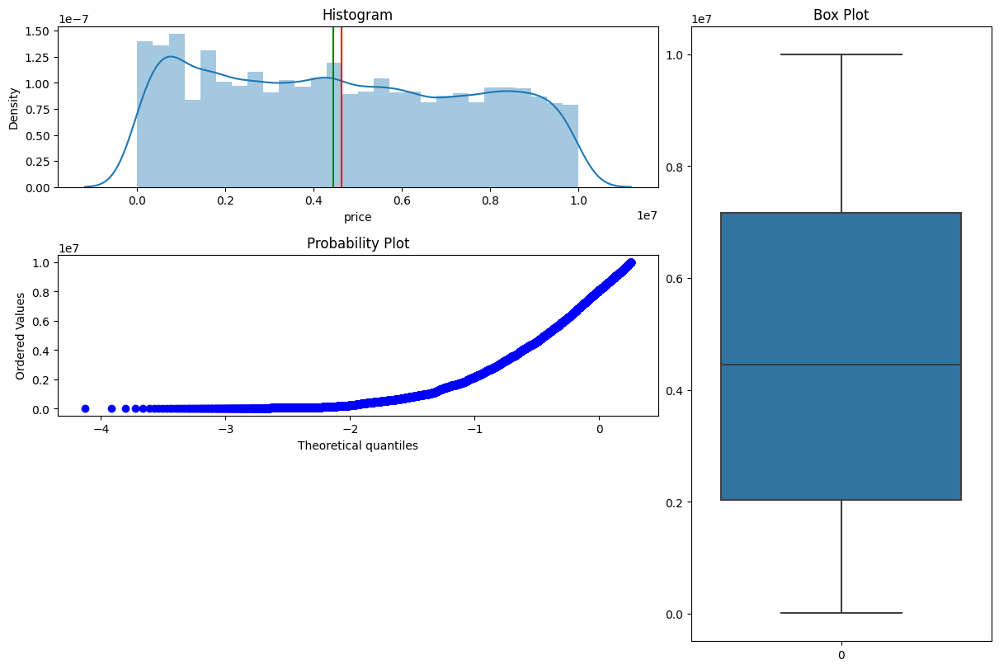

In [19]:
def three_chart_plot(df, feature):
    fig = plt.figure(constrained_layout = True, figsize = (12, 8))
    grid = gridspec.GridSpec(ncols = 3, nrows = 3, figure = fig)

    ax1 = fig.add_subplot(grid[0, :2])
    ax1.set_title('Histogram')

    sns.distplot(df.loc[:, feature], norm_hist = True, ax = ax1)
    plt.axvline(x = df[feature].mean(), c = 'red')
    plt.axvline(x = df[feature].median(), c = 'green')

    ax2 = fig.add_subplot(grid[1, :2])
    ax2.set_title('QQ_plot')
    stats.probplot(df.loc[:,feature], plot = ax2)

    ## Customizing the Box Plot.
    ax3 = fig.add_subplot(grid[:, 2])
    ## Set title.
    ax3.set_title('Box Plot')
    sns.boxplot(df.loc[:,feature], orient = 'v', ax = ax3 )

three_chart_plot(df, 'price')

From the Histogram we can see that Price of the Houses are not uniformly distributed but from the Box plot we can see that there are no outlier. The red line in histogram chart is showing the mean and green line is the representation of median price values.

In [20]:
from scipy.stats import skew
print("Skewness of the SalesPrice is", df['price'].skew())

Skewness of the SalesPrice is 0.13139962108016087


#Histogram Plot of Different Features.

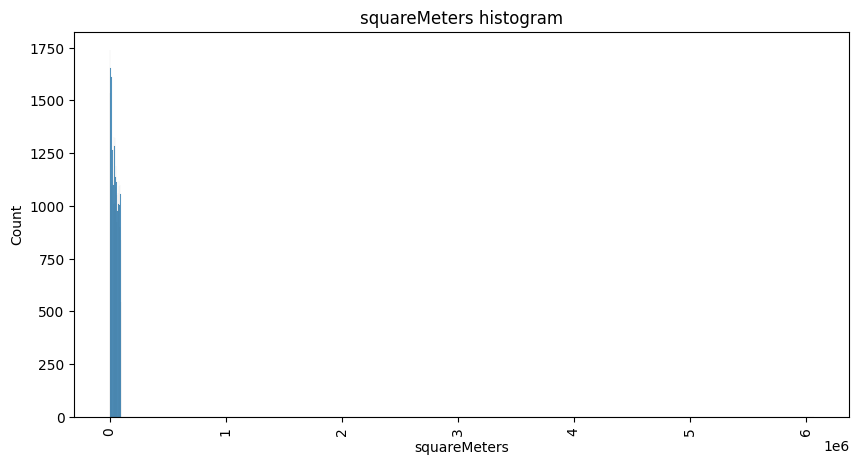

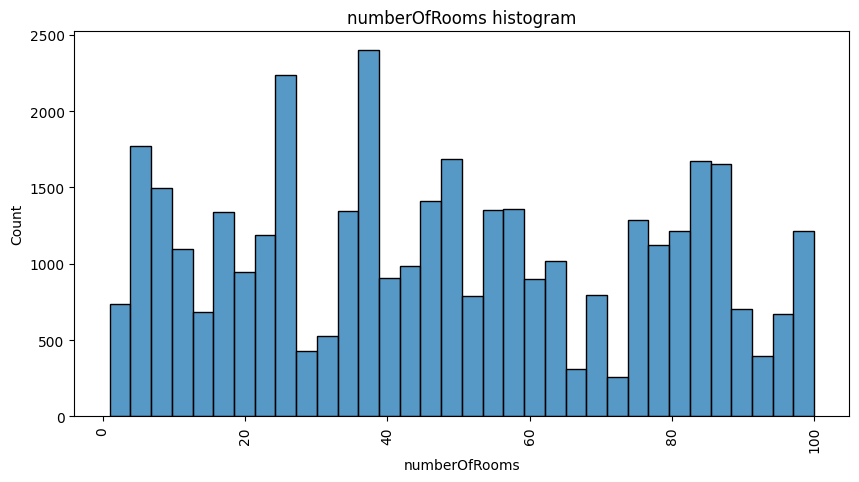

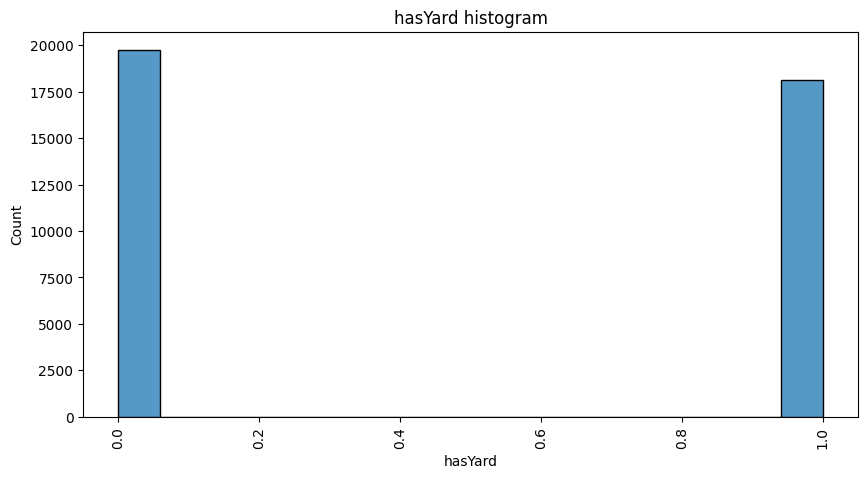

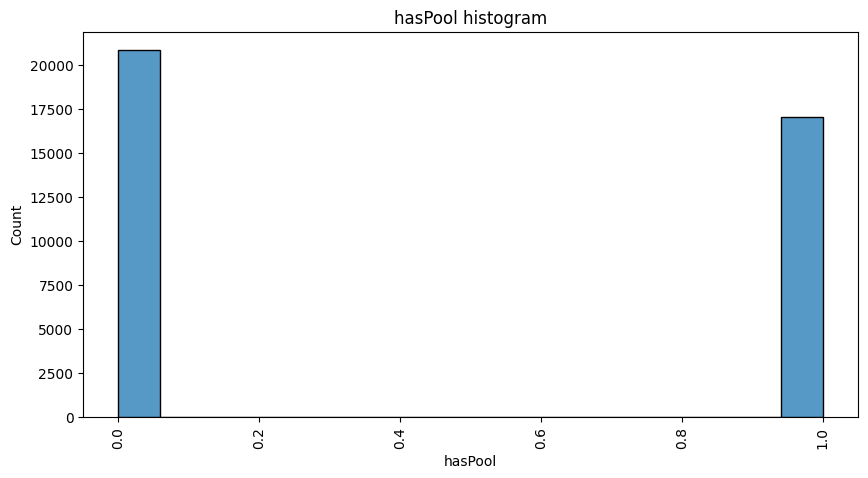

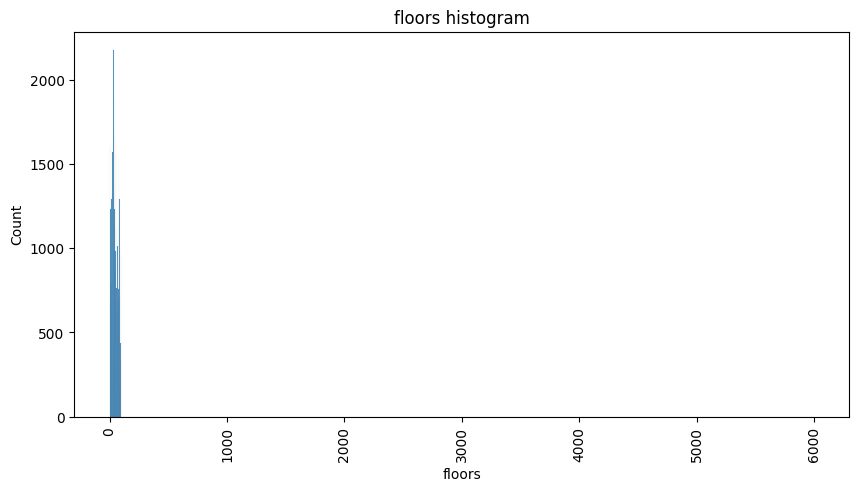

...

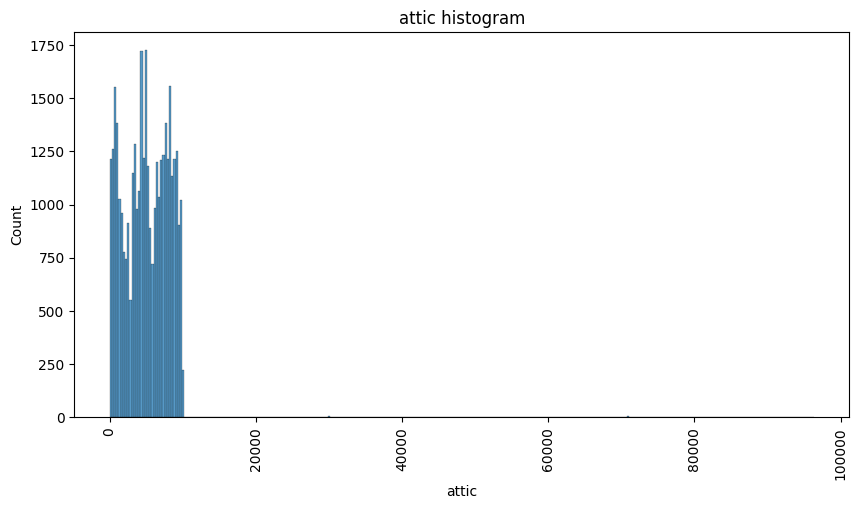

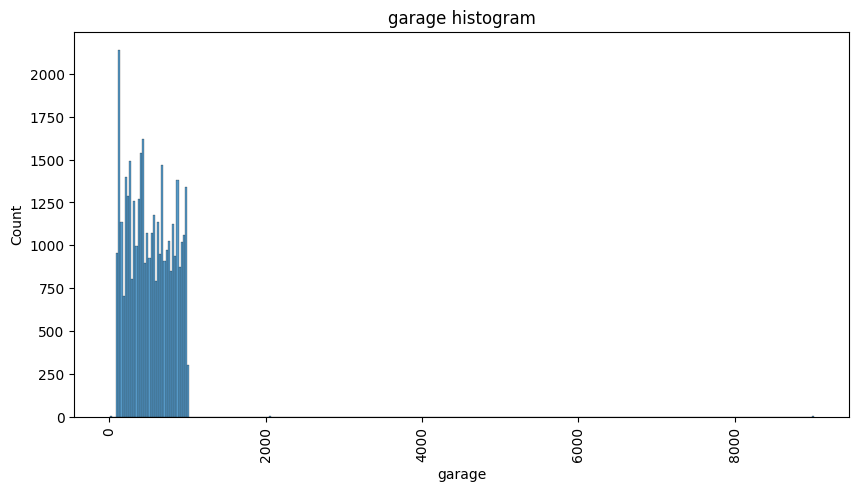

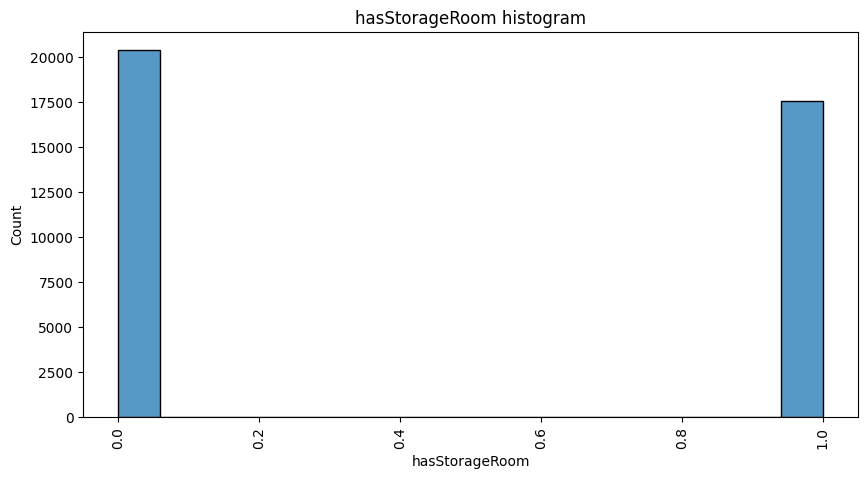

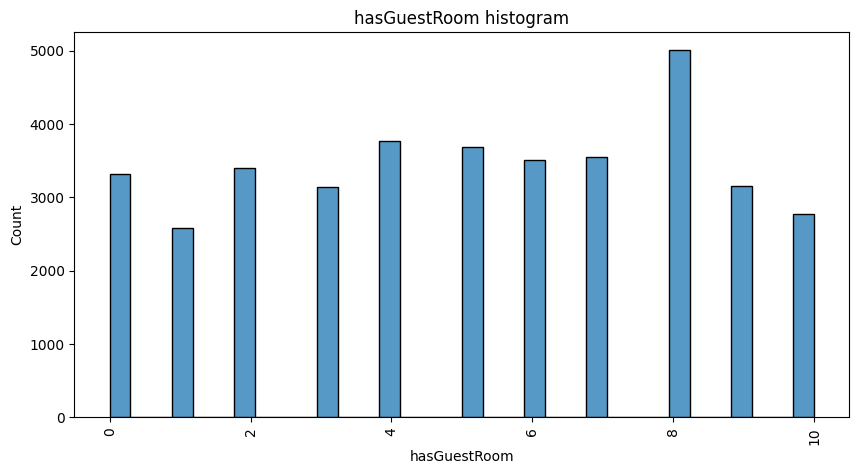

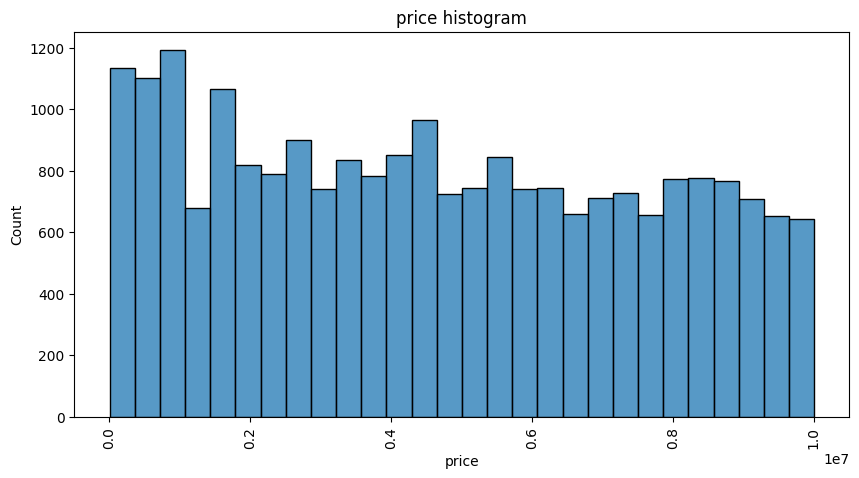

In [21]:
for col in df.columns:
  fig, ax = plt.subplots(figsize=(10, 5))
  ax.tick_params(axis='x', rotation=90)
  plt.title(f'{col} histogram')
  sns.histplot(data=df, x=col, ax=ax)
  plt.show()

#Box Plot of different Features.

<Axes: title={'center': 'Boxplot of squareMeters'}, xlabel='price'>

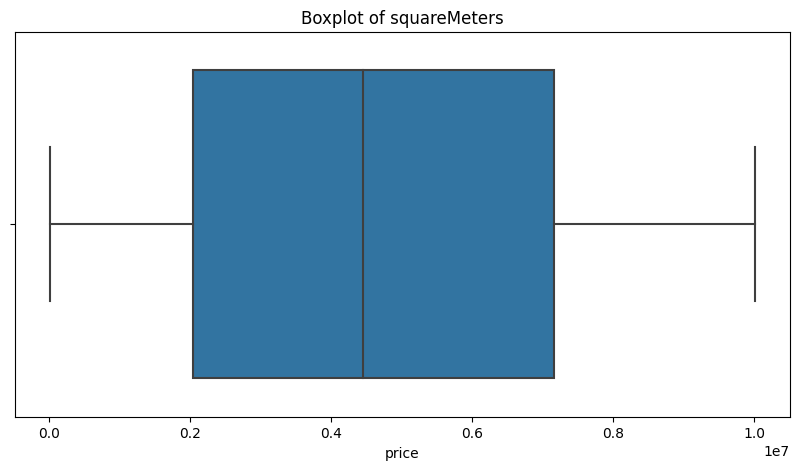

In [22]:
fig, ax = plt.subplots(figsize=(10, 5))
plt.title('Boxplot of squareMeters')
sns.boxplot(x = 'price',data = df)

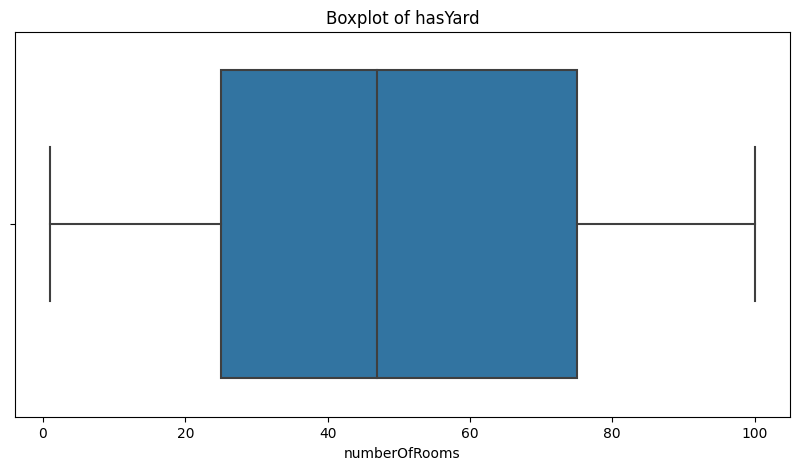

In [23]:
fig, ax = plt.subplots(figsize=(10, 5))
plt.title('Boxplot of hasYard')
sns.boxplot(data = df, x = "numberOfRooms");

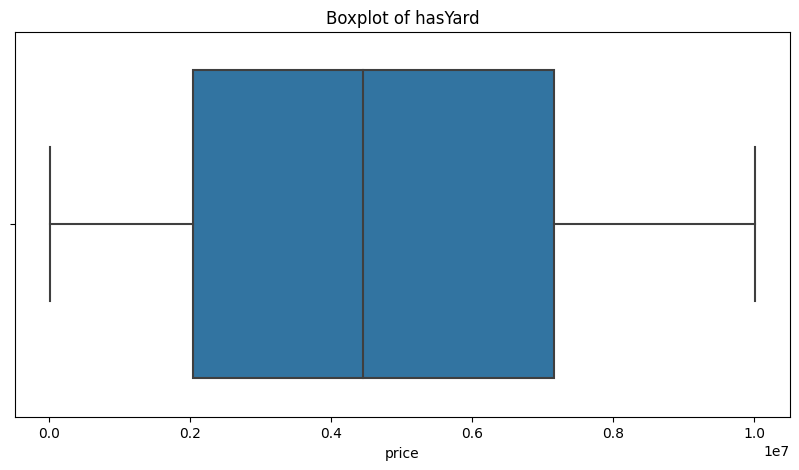

In [24]:
fig, ax = plt.subplots(figsize=(10, 5))
plt.title('Boxplot of hasYard')
sns.boxplot(data = df, x = "price");

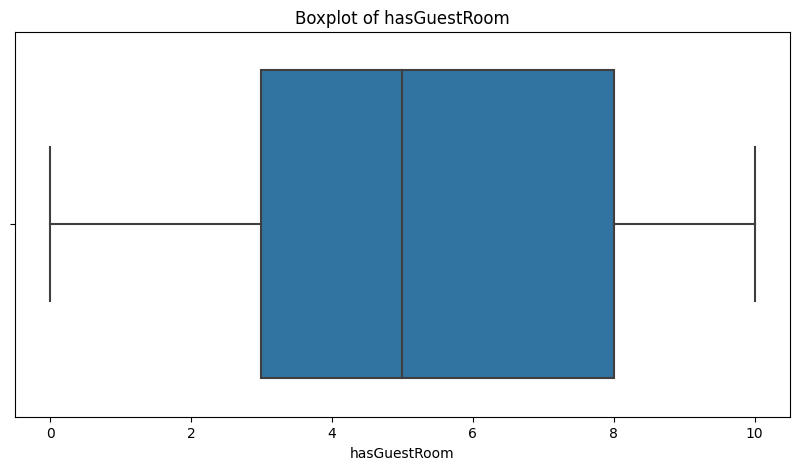

In [25]:
fig, ax = plt.subplots(figsize=(10, 5))
plt.title('Boxplot of hasGuestRoom')
sns.boxplot(data = df, x = "hasGuestRoom");

In [84]:
!pip install shap
import shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 18.2 MB/s eta 0:00:00


In [26]:
df.isnull().sum()

squareMeters             0
numberOfRooms            0
hasYard                  0
hasPool                  0
floors                   0
cityCode                 0
cityPartRange            0
numPrevOwners            0
made                     0
isNewBuilt               0
hasStormProtector        0
basement                 0
attic                    0
garage                   0
hasStorageRoom           0
hasGuestRoom             0
price                15154
dtype: int64

In [27]:
r1,c1 = train_data.shape
print('The training data has {} rows and {} columns'.format(r1,c1))
r2,c2 = test_data.shape
print('The test data has {} rows and {} columns'.format(r2,c2))

The training data has 22730 rows and 18 columns
The test data has 15154 rows and 17 columns


In [28]:
# To see the quantity of null vaues in all the columns.
# c1 stands for the number of columns in the training data.

print('MISSING VALUES IN TRAINING DATASET:')
print(train_data.isna().sum().nlargest(c1))
print('')
print('MISSING VALUES IN TEST DATASET:')
print(test_data.isna().sum().nlargest(c2))
print('')

MISSING VALUES IN TRAINING DATASET:
id                   0
squareMeters         0
hasGuestRoom         0
hasStorageRoom       0
garage               0
attic                0
basement             0
hasStormProtector    0
isNewBuilt           0
made                 0
numPrevOwners        0
cityPartRange        0
cityCode             0
floors               0
hasPool              0
hasYard              0
numberOfRooms        0
price                0
dtype: int64

MISSING VALUES IN TEST DATASET:
id                   0
made                 0
hasStorageRoom       0
garage               0
attic                0
basement             0
hasStormProtector    0
isNewBuilt           0
numPrevOwners        0
squareMeters         0
cityPartRange        0
cityCode             0
floors               0
hasPool              0
hasYard              0
numberOfRooms        0
hasGuestRoom         0
dtype: int64



In [29]:
train_data['made'].value_counts()

2000     3588
2003     1156
2014     1070
2015     1036
2007     1021
2008      981
2009      972
2019      956
2013      934
2018      927
2006      921
2004      915
2016      910
1996      822
2005      764
2017      741
1998      719
1993      651
1995      631
1994      628
2020      595
1997      592
1999      588
2010      152
2021      110
1990       77
2011       68
2001       59
1992       59
2012       51
1991       30
10000       5
2002        1
Name: made, dtype: int64

#Bar Chart to show number of houses built every year.

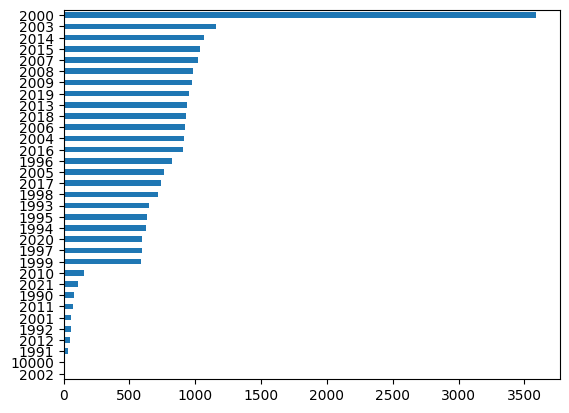

In [30]:
train_data.made.value_counts().sort_values(ascending=True).plot.barh();

In [31]:
train_data['price'].value_counts()

8522151.8    18
107936.9     18
362218.9     16
2506485.7    16
4473490.3    16
             ..
5038241.3     1
4935794.6     1
7531660.1     1
8198185.0     1
8231424.8     1
Name: price, Length: 7421, dtype: int64

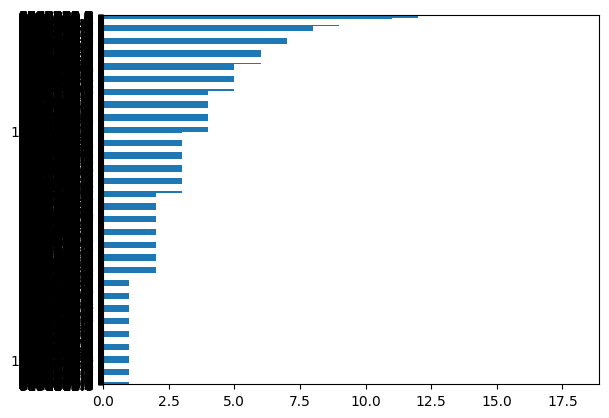

In [32]:
train_data.price.value_counts().sort_values(ascending=True).plot.barh();

###Correlation
Before we develop model for the house features, we need to check the correlation between each other and between our target value salesprice.

In [33]:
correlation = df.corr()['price'].sort_values(ascending = False).to_frame().head(15)

cmap = sns.light_palette("cyan", as_cmap = True)

s = correlation.style.background_gradient(cmap = cmap)

s

,price
price,1.000000
squareMeters,0.591749
numberOfRooms,0.091681
floors,0.038374
made,0.024270
cityCode,0.021986
hasStormProtector,0.020512
isNewBuilt,0.008080
hasPool,0.006023
hasStorageRoom,0.001567


From the Correlation Table we can see that price of house was mainly dependent on the square meters. Generally we observe that the houses with greater square meter area have high prices. same is the trend seen in this dataset.

In [34]:
def outliers(df, var):
    Q1 = df[var].quantile(0.25)
    Q3 = df[var].quantile(0.75)
    IQR = Q3 - Q1
    O1 = Q1 - (1.5*IQR)
    O3 = Q3 + (1.5*IQR)
    df.loc[(df[var] <= O1), var] = O1
    df.loc[(df[var] >= O3), var] = O3
    return df[var]

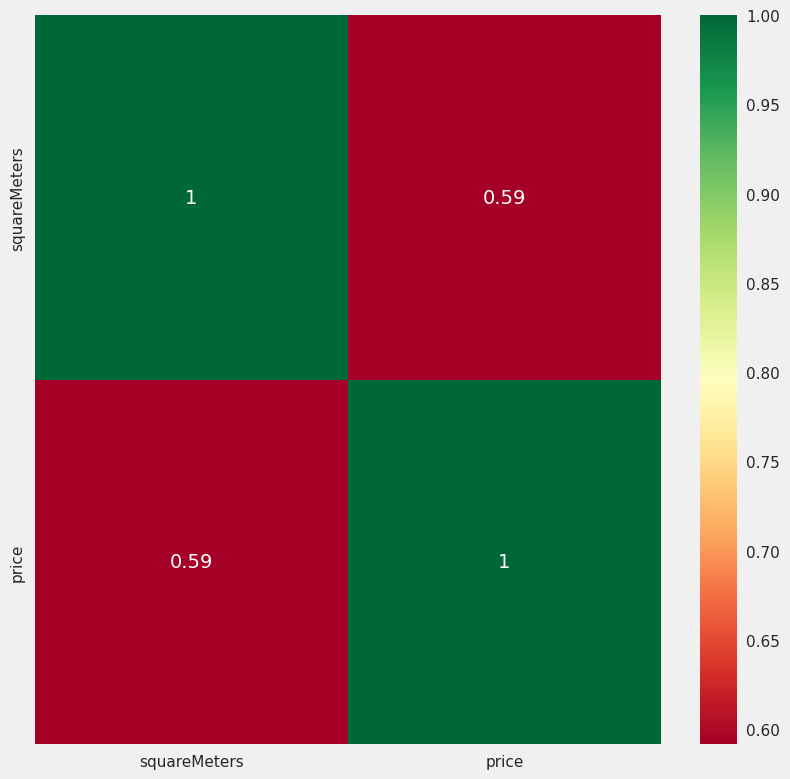

In [107]:
corrmat = df.corr()
top_corr_features = corrmat.index[abs(corrmat["price"])>0.4]
plt.figure(figsize=(9,9))
g = sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [35]:
num_cols = train_data.select_dtypes(include=np.number).columns.tolist()
num_cols.remove('id')
num_cols.remove('price')

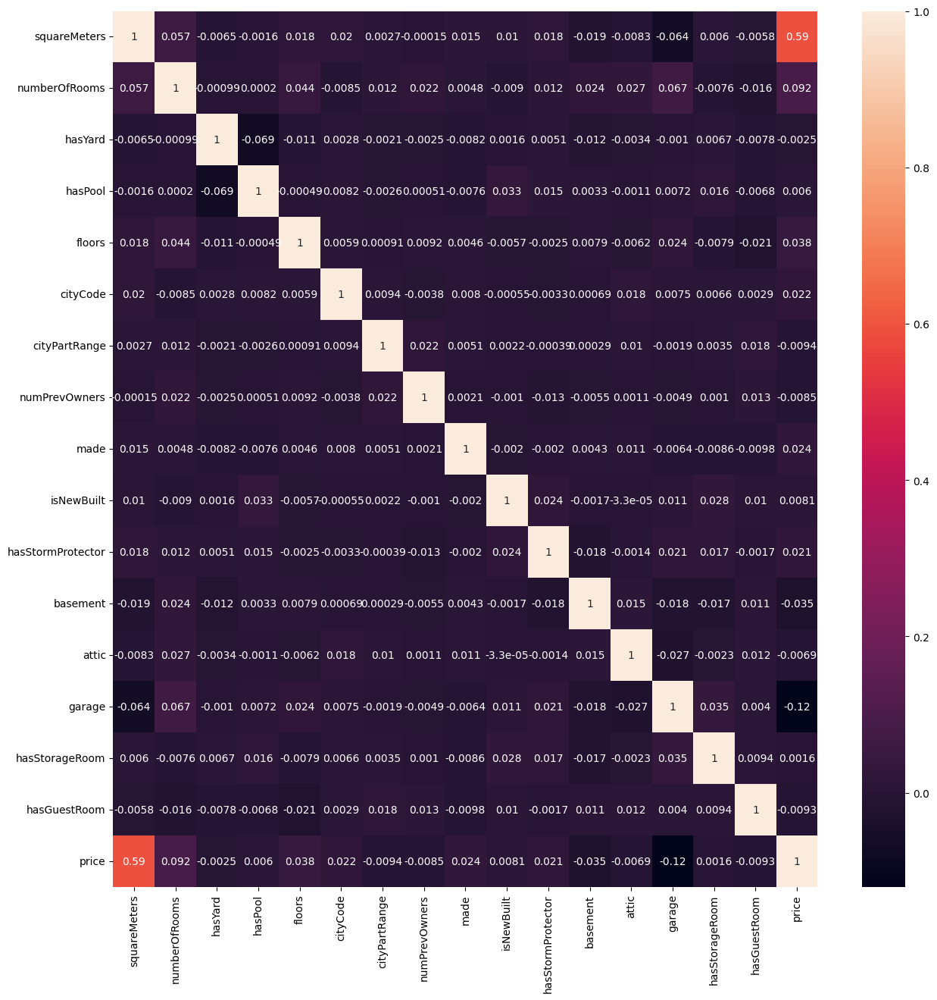

In [36]:
corr_cols = num_cols + ['price']
plt.figure(figsize=(15,15))
sns.heatmap(train_data[corr_cols].corr(),annot=True)
# plt.savefig("Heatmap.png")
plt.show()

In [37]:
squareMeters = pd.DataFrame(train_data.groupby(['squareMeters']).size()).reset_index().rename(columns = {0:'Count'})
squareMeters = squareMeters[squareMeters['squareMeters']< 5000]

squareMeters1 = pd.DataFrame(train_data.groupby(['squareMeters'])['price'].mean()).reset_index().rename(columns = {0:'mean_price'})

squareMeters = pd.merge(squareMeters,squareMeters1, on = 'squareMeters', how = 'inner')

In [38]:
train_data['squareMeters'] = outliers(train_data, 'squareMeters')
train_data['squareMeters'].describe()

count     22730.000000
mean      46325.635300
std       29253.554766
min          89.000000
25%       20392.750000
50%       44484.000000
75%       71547.000000
max      148278.375000
Name: squareMeters, dtype: float64

###Clean Outliers
I simply altered the outlier values to bring them into the proper range. There are better ways of doing this, but because there were so few outlier values compared to the total sample size, improving this section would likely not have had a large impact.

In [39]:
train_data.loc[(train_data['squareMeters'] > 1.25e5),'squareMeters'] = train_data.loc[(train_data['squareMeters'] > 1.25e5),'squareMeters']/100
train_data.drop(train_data[(train_data['squareMeters'] > 2e6)].index, inplace=True)

#We drop a few outliers.

In [40]:
print(f"Length of train before dropping outliers: {len(train_data)}")
train_data = train_data[train_data.squareMeters <= 100000]
print(f"Length of train after dropping outliers:  {len(train_data)}")

Length of train before dropping outliers: 22730
Length of train after dropping outliers:  22730


In [41]:
squareMeters = pd.DataFrame(train_data.groupby(['squareMeters']).size()).reset_index().rename(columns = {0:'Count'})
squareMeters = squareMeters[squareMeters['squareMeters']< 5000]
squareMeters1 = pd.DataFrame(train_data.groupby(['squareMeters'])['price'].mean()).reset_index().rename(columns = {0:'mean_price'})
squareMeters = pd.merge(squareMeters,squareMeters1, on = 'squareMeters', how = 'inner')

In [42]:
squareMeters[squareMeters['squareMeters']<= 1000].corr()

,squareMeters,Count,price
squareMeters,1.000000,0.140335,0.794994
Count,0.140335,1.000000,0.077512
price,0.794994,0.077512,1.000000


In [43]:
squareMeters[squareMeters['squareMeters']<= 80000].corr()

,squareMeters,Count,price
squareMeters,1.000000,-0.205499,0.406714
Count,-0.205499,1.000000,-0.144045
price,0.406714,-0.144045,1.000000


In [44]:
train_1 = train_data[train_data['squareMeters']<=20000]
test_1 = test_data[test_data['made']<=20000]
train_2 = train_data[train_data['squareMeters']<=50000]
test_2 = test_data[(test_data['made']>=20001) & (test_data['made']<=50000)]
train_3 = train_data[train_data['made']<80000]
test_3 = test_data[test_data['made']<80000]

<ipython-input-45-cc0f340a61d9>:2: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  test_1 = pd.merge(test_1,squareMeters[['squareMeters','Count']], on = 'squareMeters', how = 'inner')


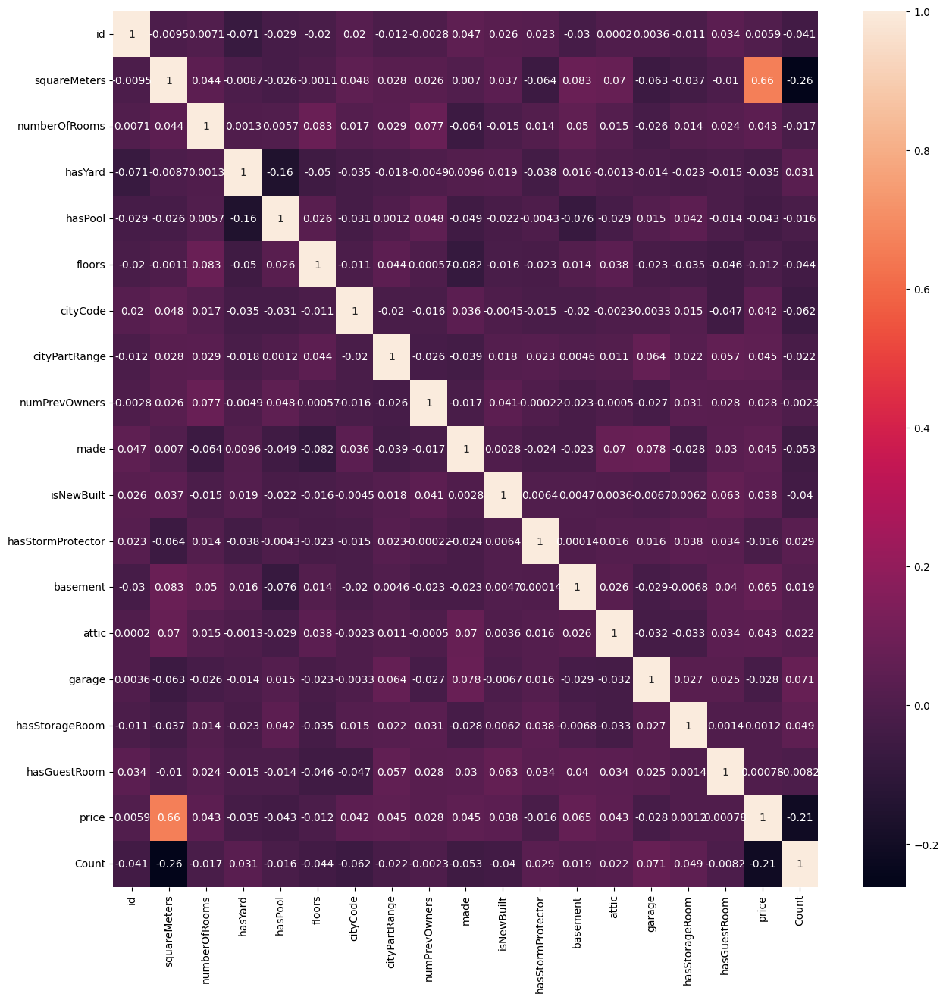

In [45]:
train_1 = pd.merge(train_1,squareMeters[['squareMeters','Count']], on = 'squareMeters', how = 'inner')
test_1 = pd.merge(test_1,squareMeters[['squareMeters','Count']], on = 'squareMeters', how = 'inner')
plt.figure(figsize=(15,15))
sns.heatmap(train_1.corr(),annot=True)
# plt.savefig("Heatmap.png")
plt.show()

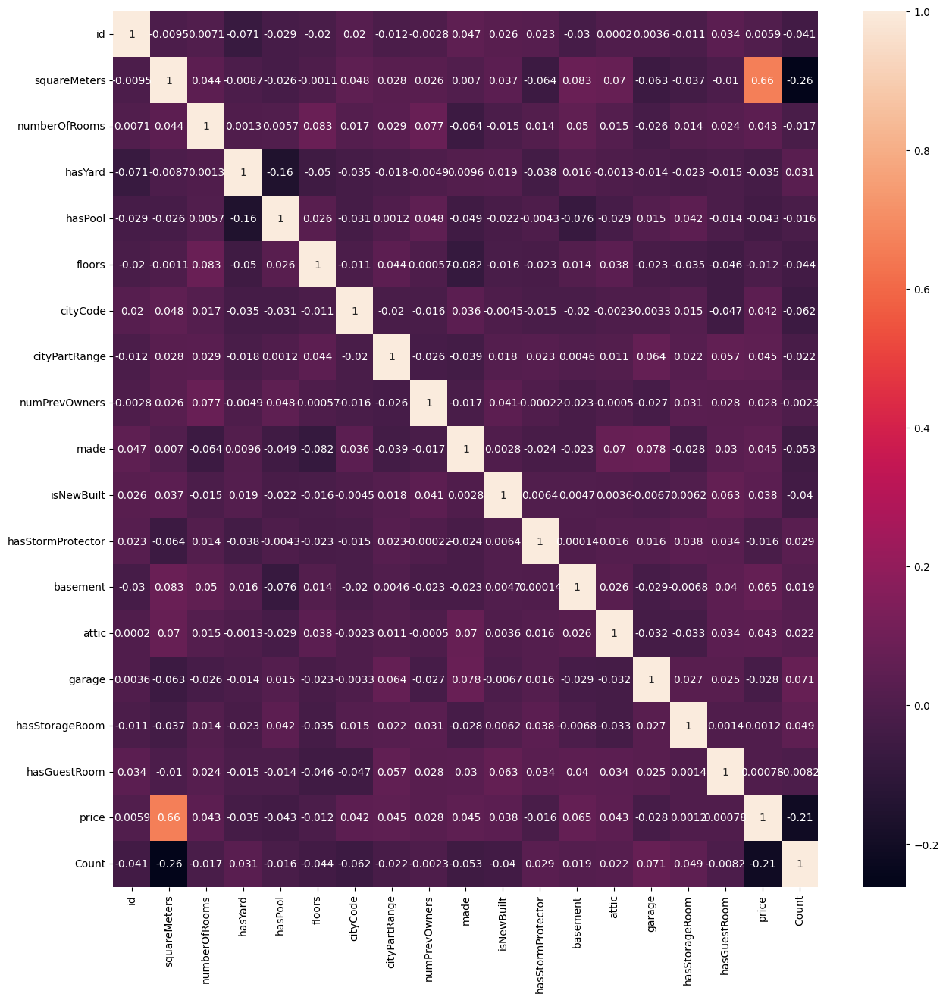

In [46]:
train_2 = pd.merge(train_2,squareMeters[['squareMeters','Count']], on = 'squareMeters', how = 'inner')
test_2 = pd.merge(test_2,squareMeters[['squareMeters','Count']], on = 'squareMeters', how = 'inner')
plt.figure(figsize=(15,15))
sns.heatmap(train_2.corr(),annot=True)
# plt.savefig("Heatmap.png")
plt.show()

<ipython-input-47-256113020a1f>:2: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  test_3 = pd.merge(test_3,squareMeters[['squareMeters','Count']], on = 'squareMeters', how = 'inner')


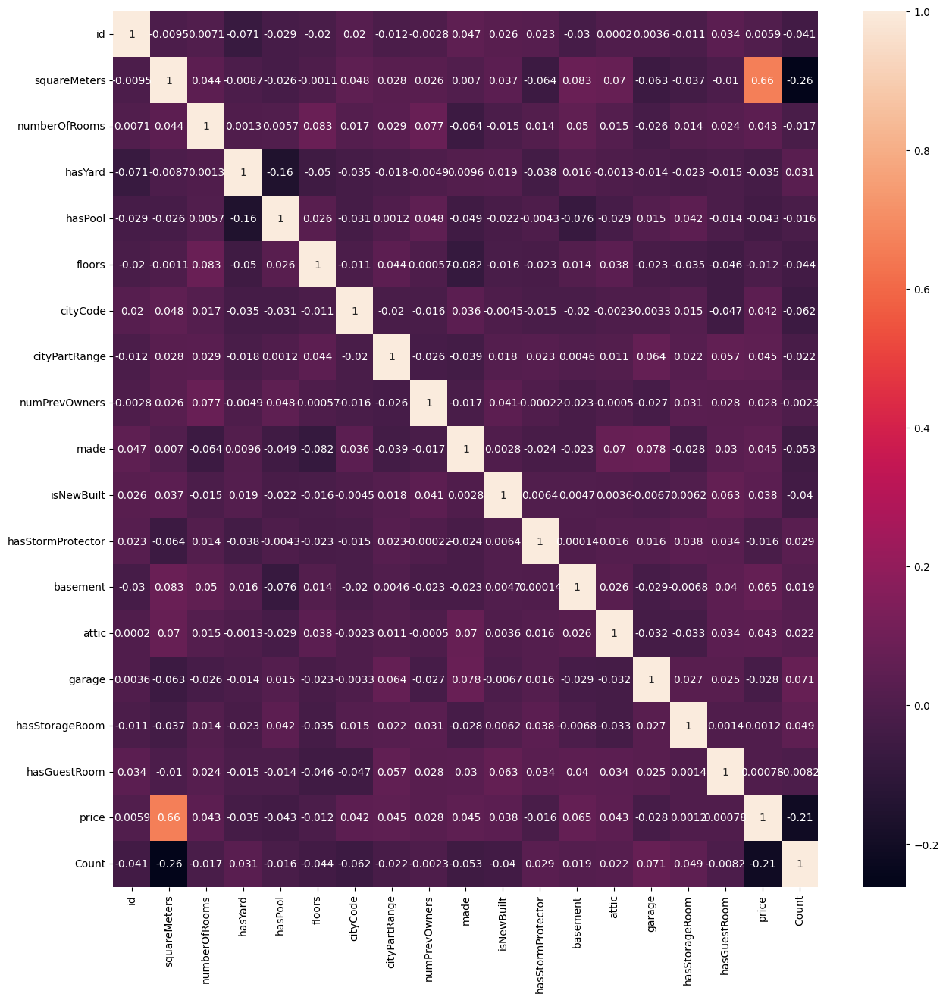

In [47]:
train_3 = pd.merge(train_3,squareMeters[['squareMeters','Count']], on = 'squareMeters', how = 'inner')
test_3 = pd.merge(test_3,squareMeters[['squareMeters','Count']], on = 'squareMeters', how = 'inner')
plt.figure(figsize=(15,15))
sns.heatmap(train_3.corr(),annot=True)
# plt.savefig("Heatmap.png")
plt.show()

###Heat Map
As our dataset is huge we are not able to see the correlation between features clearly. A better wat to do that is creating a heatmap of all the features.

<ipython-input-48-e842fe88c0a1>:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(df.corr(), dtype=np.bool))


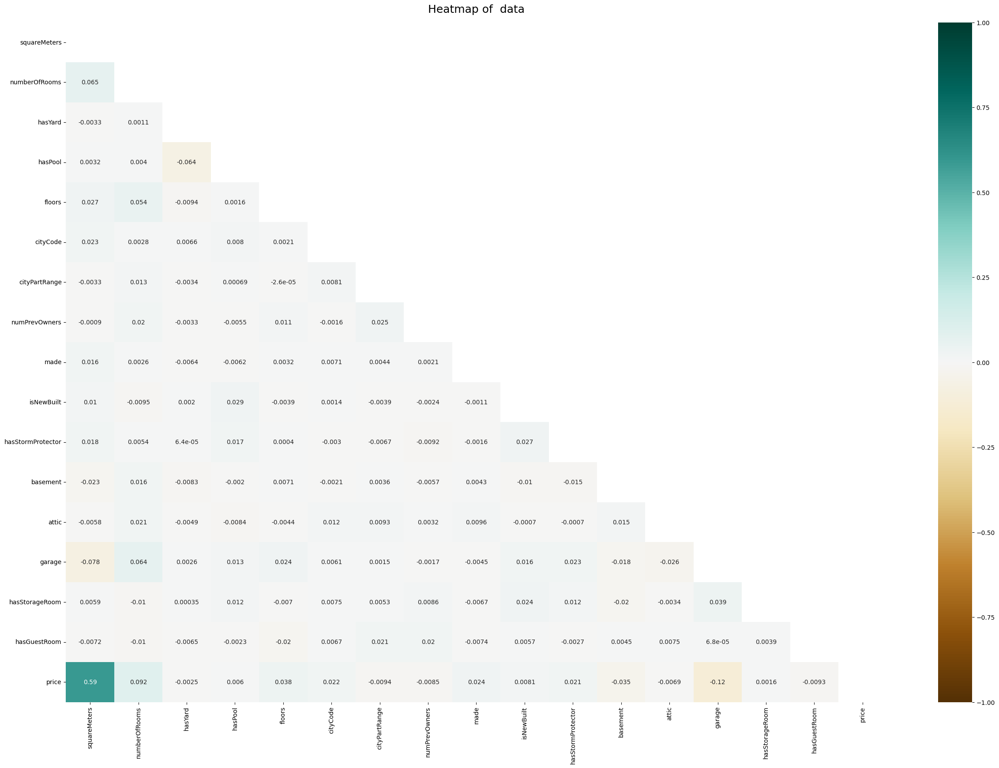

In [48]:
plt.figure(figsize=(30, 20))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df.corr(), dtype=np.bool))
heatmap = sns.heatmap(df.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Heatmap of  data', fontdict={'fontsize':18}, pad=16);

Let's inspect the features that have high correlations. As we have implied before, squareMeters has a considerable amount of correlation, 0.59. Now let's focus on our target value and try to find the features that effect the SalePrice the most.

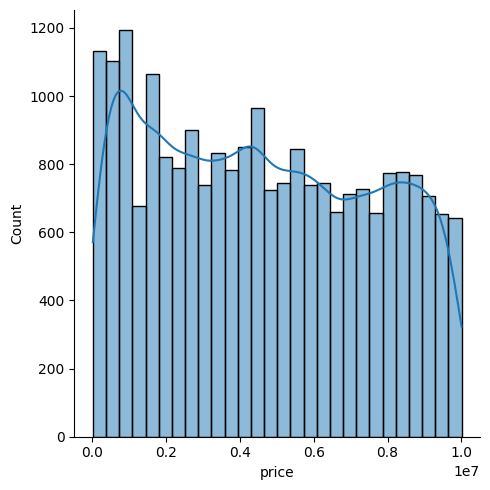

In [49]:

sns.displot(df['price'], kde='True')

###Graph to show the Linear Relationship between Price and Square Meters. Here we can see few outliers.

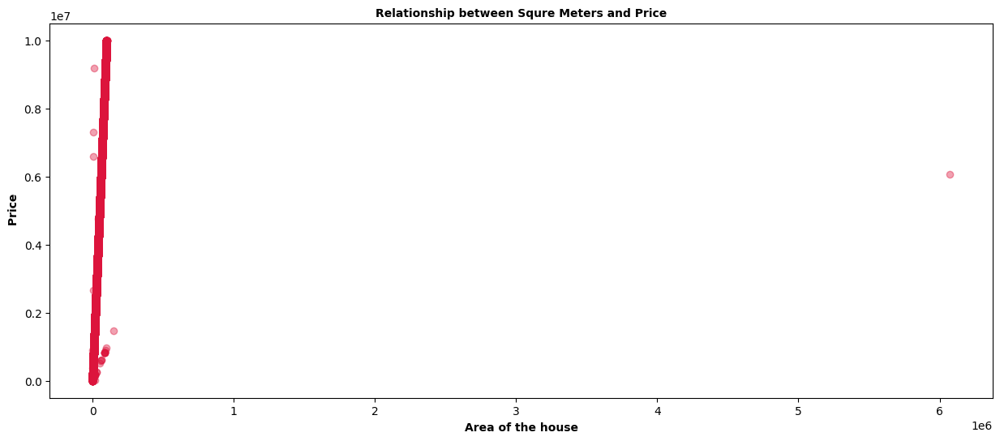

In [50]:
plt.figure(figsize = ((15, 6)))
plt.scatter(x = 'squareMeters', y = 'price', data = df, color='crimson', alpha=0.4)
plt.title('Relationship between Squre Meters and Price', weight = 'bold', fontsize = 10)
plt.xlabel('Area of the house', weight = 'bold')
plt.ylabel(' Price', weight = 'bold')
plt.show()

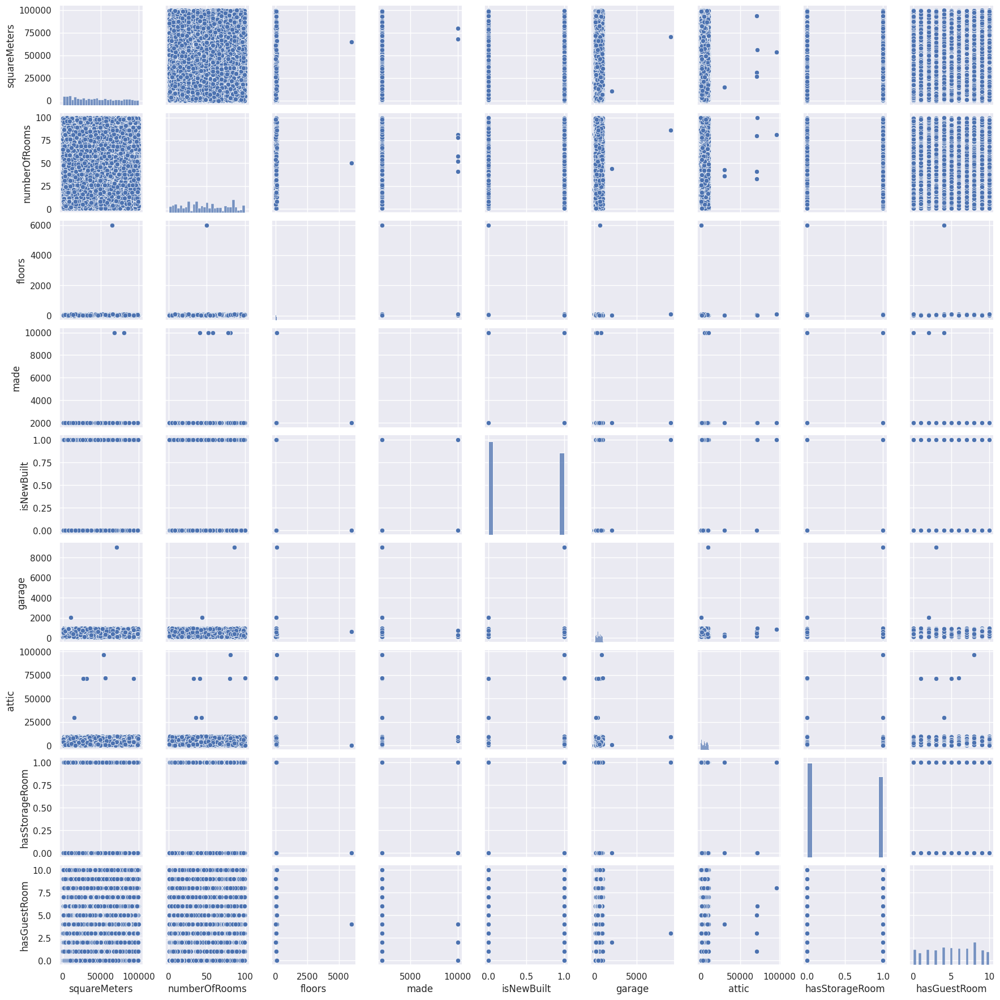

In [51]:
sns.set()
cols = ['squareMeters', 'numberOfRooms', 'floors', 'made','isNewBuilt','garage','attic','hasStorageRoom','hasGuestRoom']
sns.pairplot(train_data[cols], height = 2.0)
plt.show();

<Figure size 3000x2000 with 0 Axes>

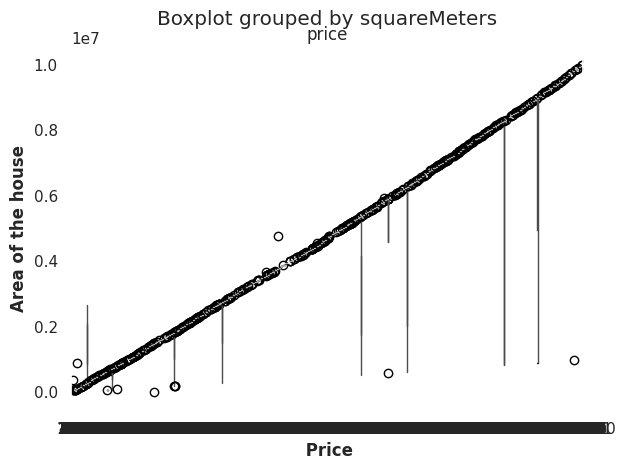

In [52]:
plt.figure(figsize = ((30, 20)))
df.boxplot(by = 'squareMeters', column = 'price')
plt.ylabel('Area of the house', weight = 'bold')
plt.xlabel(' Price', weight = 'bold')
plt.show()

Text(0, 0.5, '')

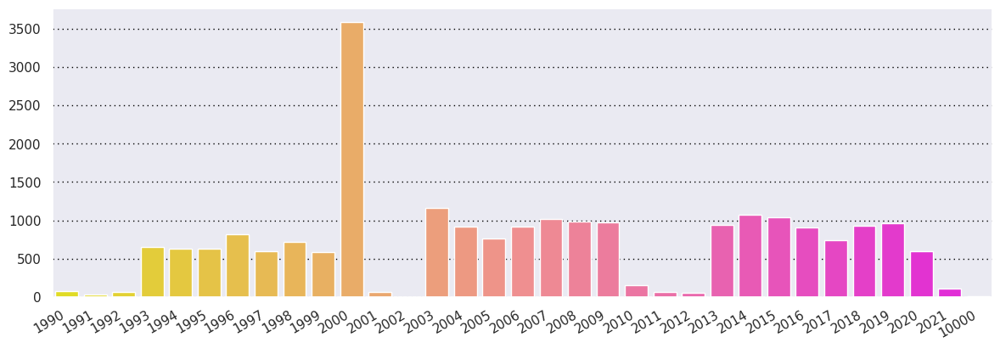

In [53]:
fig = plt.figure(figsize=(30, 5))
gs = fig.add_gridspec(1, 2)
gs.update(wspace=0.1)
ax1 = fig.add_subplot(gs[0, 1])
plt.gcf().autofmt_xdate()
plt.xlabel('my x label', size = 20)
sns.countplot(x='made', data=train_data, ax=ax1, palette='spring_r')
ax1.grid(color='#000000', linestyle=':', axis='y', zorder=0, dashes=(1,3))
ax1.set_xlabel('')
ax1.set_ylabel('')

In [54]:
!pip install autoviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.3/356.3 kB 29.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 67.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 63.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 84.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.9/121.9 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 kB 9.8 MB/s eta 0:00:00
  Created wheel for emoji: filename=emoji-2.5.1-py2.py3-none-any.whl size=351210 sha256=e6d038bb6e4be844bad2ca0f74eb57c9a9c4d44240b9fb893f7102df6189b8f1
  Stored in directory: /root/.cache/pip/wheels/51/92/44/e2ef13f803aa08711819357e6de0c5fe67b874671141413565
Successfully built emoji
  Attempting uni

In [55]:
!pip install -U --pre pycaret


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 483.6/483.6 kB 25.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 kB 17.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 20.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.1/72.1 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 62.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 71.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 

In [56]:
pip install autoviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


###Autoviz tool for Data suggestion and analysis

In [57]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
%matplotlib inline


Imported v0.1.720. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [58]:
from autoviz import data_cleaning_suggestions
data_cleaning_suggestions(train_data)

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
id,int64,0.000000,100,0.000000,22729.000000,Possible ID colum: drop before modeling process.
squareMeters,float64,0.000000,NA,89.000000,99985.000000,No issue
numberOfRooms,int64,0.000000,0,1.000000,100.000000,No issue
hasYard,int64,0.000000,0,0.000000,1.000000,No issue
hasPool,int64,0.000000,0,0.000000,1.000000,No issue
floors,int64,0.000000,0,1.000000,6000.000000,has 1 outliers greater than upper bound (135.00) or lower than lower bound(-41.00). Cap them or remove them.
cityCode,int64,0.000000,34,3.000000,491100.000000,has 6 outliers greater than upper bound (156323.50) or lower than lower bound(-57096.50). Cap them or remove them.
cityPartRange,int64,0.000000,0,1.000000,10.000000,No issue
numPrevOwners,int64,0.000000,0,1.000000,10.000000,No issue
made,int64,0.000000,0,1990.000000,10000.000000,has 5 outliers greater than upper bound (2035.00) or lower than lower bound(1979.00). Cap them or remove them.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
id,int64,0.0,100,0.0,22729.0,Possible ID colum: drop before modeling process.
squareMeters,float64,0.0,NA,89.0,99985.0,No issue
numberOfRooms,int64,0.0,0,1.0,100.0,No issue
hasYard,int64,0.0,0,0.0,1.0,No issue
hasPool,int64,0.0,0,0.0,1.0,No issue
floors,int64,0.0,0,1.0,6000.0,has 1 outliers greater than upper bound (135.00) or lower than lower bound(-41.00). Cap them or remove them.
cityCode,int64,0.0,34,3.0,491100.0,has 6 outliers greater than upper bound (156323.50) or lower than lower bound(-57096.50). Cap them or remove them.
cityPartRange,int64,0.0,0,1.0,10.0,No issue
numPrevOwners,int64,0.0,0,1.0,10.0,No issue
made,int64,0.0,0,1990.0,10000.0,has 5 outliers greater than upper bound (2035.00) or lower than lower bound(1979.00). Cap them or remove them.


#Feature Scaling

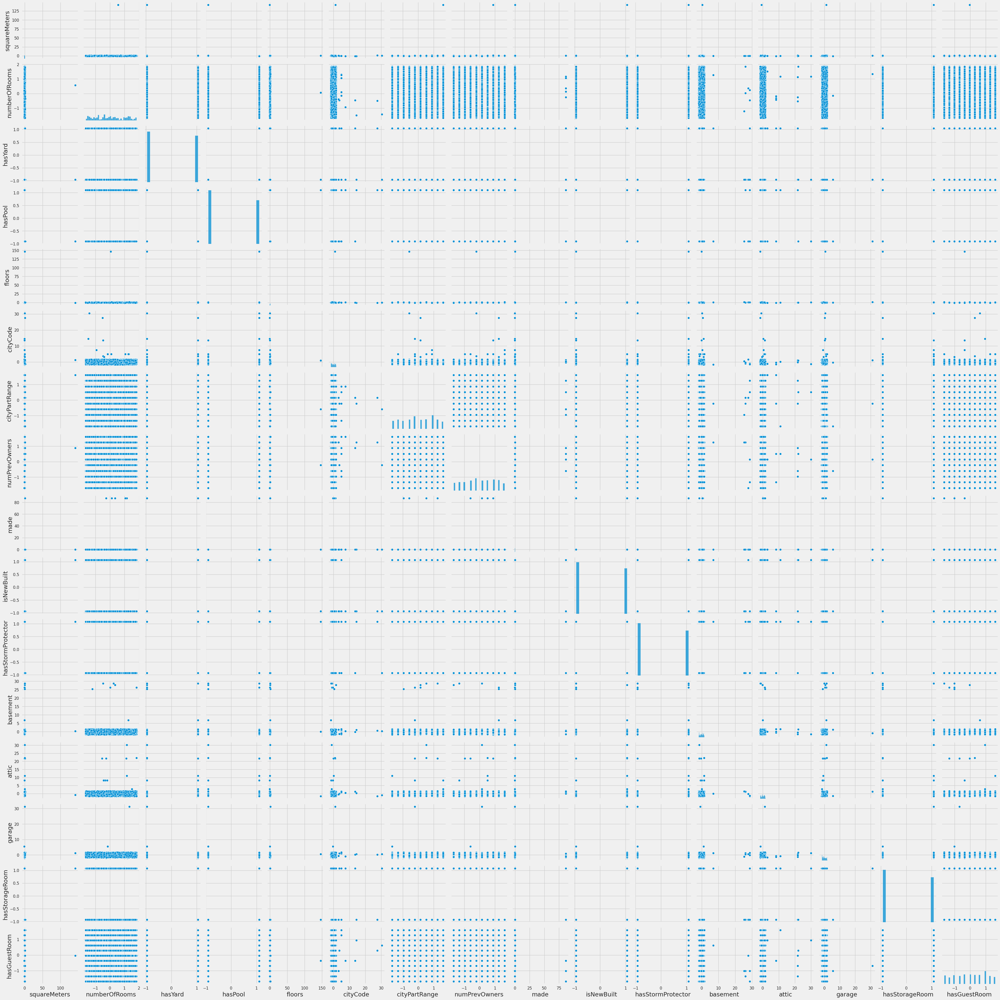

In [59]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X = pd.DataFrame(scaler.fit_transform(df))
scaled_X.columns = df.columns

# Data Visualization
_ = sns.pairplot(scaled_X.iloc[:,0:16])

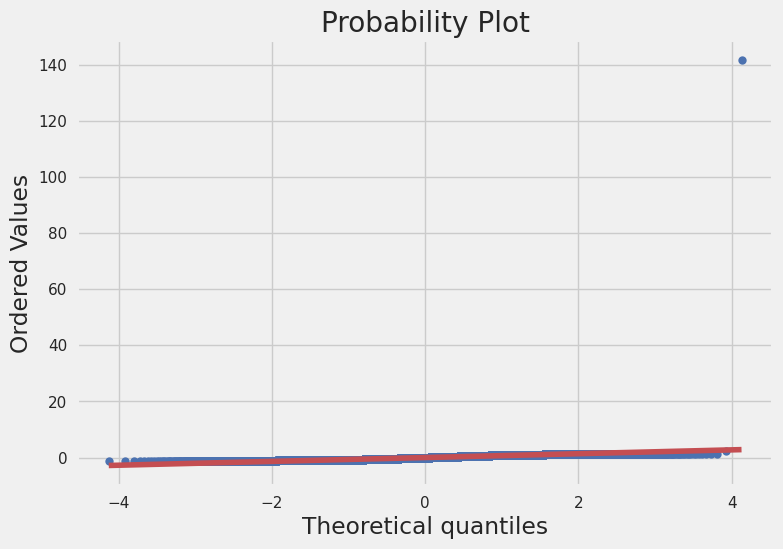

In [60]:
import pylab #PyLab is a convenience module that bulk imports matplotlib.pyplot for plotting
import scipy.stats as stats #The scipy.stats module specializes in random variables and probability distributions
stats.probplot(scaled_X.iloc[:,0], dist="norm", plot=pylab)
pylab.show()

In [61]:
squareMeters = pd.DataFrame(train_data.groupby(['squareMeters']).size()).reset_index().rename(columns = {0:'Count'})
squareMeters = squareMeters[squareMeters['squareMeters']< 5000]

squareMeters1 = pd.DataFrame(train_data.groupby(['squareMeters'])['price'].mean()).reset_index().rename(columns = {0:'mean_price'})

squareMeters = pd.merge(squareMeters,squareMeters1, on = 'squareMeters', how = 'inner')

In [62]:
train_data['squareMeters'] = outliers(train_data, 'squareMeters')
train_data['squareMeters'].describe()

count    22730.000000
mean     46312.810189
std      29241.260522
min         89.000000
25%      20392.000000
50%      44484.000000
75%      71541.000000
max      99985.000000
Name: squareMeters, dtype: float64

In [63]:
test_data['squareMeters'] = outliers(test_data, 'squareMeters')
test_data['squareMeters'].describe()

count    15154.000000
mean     45729.407681
std      29200.142520
min         69.000000
25%      19189.000000
50%      43802.000000
75%      70898.000000
max      99999.000000
Name: squareMeters, dtype: float64

In [64]:
X = df.iloc[:,:-1].values
y = df.iloc[:,:-1].values

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 50)

In [66]:
print("Training dataset : ", X_train.shape, y_train.shape)
print("Testing dataset : ", X_test.shape, y_test.shape)

Training dataset :  (30307, 16) (30307, 16)
Testing dataset :  (7577, 16) (7577, 16)


In [67]:
print(X_train)

[[31301    24     0 ...   956     1     2]
 [ 5624    84     0 ...   366     0     9]
 [  692    18     0 ...   811     0     7]
 ...
 [20195    15     1 ...   218     0     9]
 [11303    33     1 ...   696     0     6]
 [33704    35     1 ...   776     1     5]]


In [68]:
print(X_test)

[[14401    49     0 ...   864     1     1]
 [61238    26     1 ...   473     1     1]
 [88926    60     0 ...   765     1     0]
 ...
 [31706    47     0 ...   313     0     5]
 [ 5505    87     0 ...   239     1     6]
 [86800    99     0 ...   117     0     4]]


In [69]:
def score_display(scores):
    scores = np.sqrt(-scores)
    print(f"""
    RMSE Scores : {scores}
    Mean : {scores.mean()}
    Standart Deviation : {scores.std()}
    """)


###Linear Regression


In [70]:
linearmodel = LinearRegression()
linearmodel.fit(X_train,y_train)

LinearRegression()

In [71]:
linreg_scores = cross_val_score(linearmodel,
                               X_train,y_train,
                               scoring = 'neg_mean_squared_error',
                               cv=10)

In [72]:
score_display(linreg_scores)


    RMSE Scores : [1.47282845e-11 1.07366680e-11 1.45044026e-11 2.36739661e-11
 1.83488223e-11 1.29161214e-11 1.21881334e-11 1.57692457e-11
 2.70912543e-11 7.85420163e-12]
    Mean : 1.578110999495704e-11
    Standart Deviation : 5.558310577686039e-12
    


In [73]:
linear_prediction = linearmodel.predict(X)
linear_prediction

array([[ 4.75800000e+04,  8.90000000e+01, -2.80757103e-13, ...,
         2.41000000e+02,  1.15560194e-15,  8.00000000e+00],
       [ 6.20830000e+04,  3.80000000e+01, -1.72181404e-12, ...,
         3.93000000e+02,  1.00000000e+00,  4.00000000e+00],
       [ 9.04990000e+04,  7.50000000e+01,  1.00000000e+00, ...,
         3.05000000e+02, -3.83877001e-15,  2.00000000e+00],
       ...,
       [ 9.31920000e+04,  4.20000000e+01,  1.00000000e+00, ...,
         7.89000000e+02, -6.27143651e-15, -3.52407338e-15],
       [ 6.57970000e+04,  8.60000000e+01,  1.00000000e+00, ...,
         4.11000000e+02,  3.32909268e-15,  3.60387664e-14],
       [ 8.22440000e+04,  1.80000000e+01,  1.00000000e+00, ...,
         5.72000000e+02,  5.61322535e-15,  6.00000000e+00]])

In [74]:
y_pred = linearmodel.predict(X_test)
print(y_pred)

[[ 1.44010000e+04  4.90000000e+01 -7.25533201e-13 ...  8.64000000e+02
   1.00000000e+00  1.00000000e+00]
 [ 6.12380000e+04  2.60000000e+01  1.00000000e+00 ...  4.73000000e+02
   1.00000000e+00  1.00000000e+00]
 [ 8.89260000e+04  6.00000000e+01  5.83362658e-13 ...  7.65000000e+02
   1.00000000e+00  1.90261179e-14]
 ...
 [ 3.17060000e+04  4.70000000e+01 -1.07173813e-12 ...  3.13000000e+02
   2.20351996e-15  5.00000000e+00]
 [ 5.50500000e+03  8.70000000e+01 -1.07306876e-12 ...  2.39000000e+02
   1.00000000e+00  6.00000000e+00]
 [ 8.68000000e+04  9.90000000e+01  6.38402004e-13 ...  1.17000000e+02
   1.77028526e-16  4.00000000e+00]]


###Developing a Model
In this second section of the project, we will develop the tools and techniques necessary for a model to make a prediction. Being able to make accurate evaluations of each model’s performance through the use of these tools and technique

In [75]:
classifier = LinearRegression()
classifier.fit(X_train, y_train)

guesses = classifier.predict(X_test)

mean_squared_error(y_test, guesses)

1.4478521156566535e-22

In [76]:
linear = LinearRegression()
random_forest = RandomForestRegressor()
Ridgemodel = Ridge(alpha=0.1)
XGBReg=xgb.XGBRegressor()






In [105]:
XGBReg1=xgb.XGBRegressor(colsample_bytree=0.4603, gamma=0.0468,
                             learning_rate=0.05, max_depth=3,
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213, silent=1,
                             random_state =7, nthread = -1)

In [99]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import Lasso

In [100]:
lasso = make_pipeline(RobustScaler(), Lasso(alpha =0.0005, random_state=1))

In [102]:
random_forest.fit(X_train,y_train)
linear.fit(X_train,y_train)
Ridgemodel.fit(X_train, y_train)
lasso.fit(X_train, y_train)
XGBReg.fit(X_train, y_train);

In [106]:
XGBReg1.fit(X_train, y_train)

[19:24:17] WARNING: ../src/learner.cc:767: 
Parameters: { "silent" } are not used.



XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.4603, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.0468, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=1.7817, missing=nan, monotone_constraints=None,
             n_estimators=2200, n_jobs=None, nthread=-1, num_parallel_tree=None,
             predictor=None, ...)

In [103]:
random_forest_preds = random_forest.predict(X_test)
linear_preds = linear.predict(X_test)
lasso_preds=lasso.predict(X_test)
Ridge_prediction = Ridgemodel.predict(X_test)
XGBReg_prediction = XGBReg.predict(X_test)


In [109]:
random_forest_preds

array([[1.480030e+04, 3.896000e+01, 3.500000e-01, ..., 5.936900e+02,
        3.300000e-01, 3.950000e+00],
       [6.166253e+04, 4.131000e+01, 7.100000e-01, ..., 4.954000e+02,
        6.600000e-01, 5.320000e+00],
       [8.910496e+04, 6.388000e+01, 2.500000e-01, ..., 5.604900e+02,
        5.800000e-01, 5.360000e+00],
       ...,
       [3.175386e+04, 4.181000e+01, 4.900000e-01, ..., 5.215800e+02,
        4.800000e-01, 5.480000e+00],
       [5.680250e+03, 5.711000e+01, 5.100000e-01, ..., 5.209200e+02,
        4.900000e-01, 4.940000e+00],
       [8.794098e+04, 3.853000e+01, 3.500000e-01, ..., 4.834000e+02,
        3.900000e-01, 4.770000e+00]])

In [108]:
linear_preds

array([[ 1.44010000e+04,  4.90000000e+01, -7.25533201e-13, ...,
         8.64000000e+02,  1.00000000e+00,  1.00000000e+00],
       [ 6.12380000e+04,  2.60000000e+01,  1.00000000e+00, ...,
         4.73000000e+02,  1.00000000e+00,  1.00000000e+00],
       [ 8.89260000e+04,  6.00000000e+01,  5.83362658e-13, ...,
         7.65000000e+02,  1.00000000e+00,  1.90261179e-14],
       ...,
       [ 3.17060000e+04,  4.70000000e+01, -1.07173813e-12, ...,
         3.13000000e+02,  2.20351996e-15,  5.00000000e+00],
       [ 5.50500000e+03,  8.70000000e+01, -1.07306876e-12, ...,
         2.39000000e+02,  1.00000000e+00,  6.00000000e+00],
       [ 8.68000000e+04,  9.90000000e+01,  6.38402004e-13, ...,
         1.17000000e+02,  1.77028526e-16,  4.00000000e+00]])

In [110]:
lasso_preds

array([[1.44010004e+04, 4.89999719e+01, 9.60602219e-04, ...,
        8.63998948e+02, 9.98921152e-01, 1.00111025e+00],
       [6.12379998e+04, 2.60006958e+01, 9.98957232e-01, ...,
        4.73000168e+02, 9.98921152e-01, 1.00111025e+00],
       [8.89259995e+04, 5.99996257e+01, 9.60602219e-04, ...,
        7.64999257e+02, 9.98921152e-01, 1.37866431e-03],
       ...,
       [3.17060002e+04, 4.70000348e+01, 9.60602219e-04, ...,
        3.13000667e+02, 9.31892258e-04, 5.00003660e+00],
       [5.50500051e+03, 8.69987758e+01, 9.60602219e-04, ...,
        2.39000898e+02, 9.98921152e-01, 5.99976818e+00],
       [8.67999995e+04, 9.89983981e+01, 9.60602219e-04, ...,
        1.17001279e+02, 9.31892258e-04, 4.00030501e+00]])

In [111]:
Ridge_prediction

array([[1.44010000e+04, 4.90000000e+01, 5.78977834e-06, ...,
        8.64000000e+02, 9.99993018e-01, 1.00000146e+00],
       [6.12380000e+04, 2.60000001e+01, 9.99992667e-01, ...,
        4.73000000e+02, 9.99992765e-01, 1.00000146e+00],
       [8.89260000e+04, 6.00000000e+01, 6.96826801e-06, ...,
        7.65000000e+02, 9.99993221e-01, 1.79554887e-06],
       ...,
       [3.17060000e+04, 4.70000000e+01, 5.82581084e-06, ...,
        3.13000000e+02, 5.76577131e-06, 5.00000003e+00],
       [5.50500000e+03, 8.69999998e+01, 6.78036379e-06, ...,
        2.39000000e+02, 9.99992019e-01, 5.99999962e+00],
       [8.68000000e+04, 9.89999998e+01, 6.91281893e-06, ...,
        1.17000000e+02, 5.76431627e-06, 4.00000043e+00]])

In [112]:
XGBReg_prediction

array([[1.4387494e+04, 4.9000019e+01, 5.2162686e-06, ..., 8.6391492e+02,
        9.9999416e-01, 1.0000049e+00],
       [6.1228699e+04, 2.6000006e+01, 9.9999434e-01, ..., 4.7291843e+02,
        9.9999416e-01, 1.0000049e+00],
       [8.8980211e+04, 5.9999813e+01, 5.2162686e-06, ..., 7.6401642e+02,
        9.9999416e-01, 1.3286685e-05],
       ...,
       [3.1770432e+04, 4.6999924e+01, 5.2162686e-06, ..., 3.1294662e+02,
        5.0455878e-06, 5.0000010e+00],
       [5.5330811e+03, 8.6999939e+01, 5.2162686e-06, ..., 2.3904141e+02,
        9.9999416e-01, 6.0000000e+00],
       [8.6832523e+04, 9.8999977e+01, 5.2162686e-06, ..., 1.1684751e+02,
        5.0455878e-06, 3.9999990e+00]], dtype=float32)

#Now lets create a new dataset just to predict a price

In [117]:
testhouse ={'squareMeters':55000,'numberOfRooms':75,'hasYard':1,'hasPool':1,'floors':50,'cityCode':50,'cityPartRange':3,'numPrevOwners':3,
          'made':2015,'isNewBuilt':1,'hasStormProtector':1,'basement':3,'attic':6000, 'garage':300,'hasStorageRoom':1, 'hasGuestRoom':6}
index=[1]
predictme = pd.DataFrame(testhouse, index)

In [118]:
predictme

,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom
1,55000,75,1,1,50,50,3,3,2015,1,1,3,6000,300,1,6


In [137]:
Linear_Accuracy=linear.score(X,y)
print('Linear Regression Accuracy: {:.8}'.format(Linear_Accuracy))


Linear Regression Accuracy: 1.0


In [138]:
Ridgemodel_Accuracy=Ridgemodel.score(X,y)
print('Ridge Model Accuracy: {:.8}'.format(Ridgemodel_Accuracy))


Ridge Model Accuracy: 1.0


In [139]:
Lasso_Accuracy=lasso.score(X,y)
print('Lasso Model Accuracy: {:.8}'.format(Lasso_Accuracy))


Lasso Model Accuracy: 0.99999872


In [140]:
RandomForest_Accuracy=random_forest.score(X,y)
print('Random Forest Accuacy: {:.8}'.format(RandomForest_Accuracy))


Random Forest Accuacy: 0.75369393


In [141]:
XGB_Accuracy=linear.score(X,y)
print('XGB Accuracy: {:.8}'.format(XGB_Accuracy))


XGB Accuracy: 1.0


#Prediction of Different Model on Custom House

In [142]:
predict_price=linear.predict(predictme)
rounded_price = np.round(predict_price, 2)
print(f" The test house price is: {rounded_price} $ ")

 The test house price is: [[5.500e+04 7.500e+01 1.000e+00 1.000e+00 5.000e+01 5.000e+01 3.000e+00
  3.000e+00 2.015e+03 1.000e+00 1.000e+00 3.000e+00 6.000e+03 3.000e+02
  1.000e+00 6.000e+00]] $ 


In [143]:
predict_price=random_forest.predict(predictme)
rounded_price = np.round(predict_price, 2)
print(f" The test house price is: {rounded_price} $ ")

 The test house price is: [[5.533327e+04 6.313000e+01 4.200000e-01 6.000000e-01 5.294000e+01
  1.502120e+03 4.590000e+00 6.020000e+00 2.006060e+03 5.100000e-01
  3.800000e-01 2.253610e+03 6.798320e+03 4.995800e+02 4.000000e-01
  4.710000e+00]] $ 


In [144]:
predict_price=Ridgemodel.predict(predictme)
rounded_price = np.round(predict_price, 2)
print(f" The test house price is: {rounded_price} $ ")

 The test house price is: [[5.500e+04 7.500e+01 1.000e+00 1.000e+00 5.000e+01 5.000e+01 3.000e+00
  3.000e+00 2.015e+03 1.000e+00 1.000e+00 3.000e+00 6.000e+03 3.000e+02
  1.000e+00 6.000e+00]] $ 


In [145]:
predict_price=lasso.predict(predictme)
rounded_price = np.round(predict_price, 2)
print(f" The test house price is: {rounded_price} $ ")

 The test house price is: [[5.500e+04 7.500e+01 1.000e+00 1.000e+00 5.000e+01 5.000e+01 3.000e+00
  3.000e+00 2.015e+03 1.000e+00 1.000e+00 3.000e+00 6.000e+03 3.000e+02
  1.000e+00 6.000e+00]] $ 


In [146]:
predict_price=XGBReg.predict(predictme)
rounded_price = np.round(predict_price, 2)
print(f" The test house price is: {rounded_price} $ ")

 The test house price is: [[5.488404e+04 7.500000e+01 1.000000e+00 1.000000e+00 5.000000e+01
  6.176000e+01 3.000000e+00 3.000000e+00 2.015000e+03 1.000000e+00
  1.000000e+00 9.640000e+00 6.003830e+03 2.991000e+02 1.000000e+00
  6.000000e+00]] $ 


In [147]:
import math

###Displaying Results of different Models

In [148]:
for label, preds in [('Random Forest', random_forest_preds),
                     ('Linear',        linear_preds),
                     ('Lasso',        lasso_preds),
                     ('Ridge',          Ridge_prediction),
                     ('XGBoosting', XGBReg_prediction)]:

    r2 = r2_score(y_test, preds)
    mse = mean_squared_error(y_test, preds)
    mae = mean_absolute_error(y_test, preds)
    rmse = math.sqrt(mse)

    print('\n  --- {} ---'.format(label))
    print('           R2 Score: {:.8}'.format(r2))
    print(' Mean Squared Error: {:.8}'.format(mse))
    print('Mean Absolute Error: {:.8}'.format(mae))
    print('Root Mean Square Error: {:.8}'.format(rmse))


  --- Random Forest ---
           R2 Score: 0.27616744
 Mean Squared Error: 3133752.8
Mean Absolute Error: 168.88695
Root Mean Square Error: 1770.2409

  --- Linear ---
           R2 Score: 1.0
 Mean Squared Error: 1.4478521e-22
Mean Absolute Error: 4.7671981e-12
Root Mean Square Error: 1.2032673e-11

  --- Lasso ---
           R2 Score: 0.99999872
 Mean Squared Error: 1.1513665e-05
Mean Absolute Error: 0.001557219
Root Mean Square Error: 0.0033931792

  --- Ridge ---
           R2 Score: 1.0
 Mean Squared Error: 1.4000129e-11
Mean Absolute Error: 2.2602239e-06
Root Mean Square Error: 3.7416746e-06

  --- XGBoosting ---
           R2 Score: 0.99661117
 Mean Squared Error: 117490.28
Mean Absolute Error: 9.0862063
Root Mean Square Error: 342.76855
